In [ ]:
# clone YOLOv5 repository
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
!git reset --hard 064365d8683fd002e9ad789c1e91fa3d021b44f0

Cloning into 'yolov5'...
remote: Enumerating objects: 15529, done.
remote: Counting objects: 100% (136/136), done.
remote: Compressing objects: 100% (93/93), done.
remote: Total 15529 (delta 49), reused 118 (delta 43), pack-reused 15393
Receiving objects: 100% (15529/15529), 14.59 MiB | 15.94 MiB/s, done.
Resolving deltas: 100% (10573/10573), done.
/content/yolov5
HEAD is now at 064365d Update parse_opt() in export.py to work as in train.py (#10789)


In [ ]:
# install dependencies as necessary
!pip install -qr requirements.txt  # install dependencies (ignore errors)
import torch

from IPython.display import Image, clear_output  # to display images
from utils.downloads import attempt_download  # to download models/datasets

# clear_output()
print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 184.3/184.3 kB 11.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 8.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 56.6 MB/s eta 0:00:00
Setup complete. Using torch 2.0.0+cu118 _CudaDeviceProperties(name='Tesla T4', major=7, minor=5, total_memory=15101MB, multi_processor_count=40)


In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="m5f87cPuFtT75iHkUlGf")
project = rf.workspace("shreespace").project("counting-idcard")
dataset = project.version(2).download("yolov5")

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.2/56.2 kB 1.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 kB 10.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 7.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 8.9 MB/s eta 0:00:00
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9676 sha256=cb0a6ea3a9a9324f237fb0a1ce894b25e229f93588d5352acad0d4f3e8e078d8
  Stored in directory: /root/.cache/pip/wheels/04/5f/3e/46cc37c5d698415694d83f607f833f83f0149e49b3af9d0f38
Successfully built wget
  Attempting uninstall: pyparsing
    Found existing installation: pyparsing 3.0.9
    Uninstalling pyparsing-3.0.9:
      Successfully uninstalled pyparsing-3.0.9
  Attempting uninstall: idna
    Found existing installation: idna 3.4
    Uninstalling idna-3.4:
   

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to counting-idcard-2 in yolov5pytorch:: 100%|██████████| 1006/1006 [00:00<00:00, 2586.00it/s]


In [ ]:
%cd /content/yolov5
#after following the link above, recieve python code with these fields filled in
#from roboflow import Roboflow
#rf = Roboflow(api_key="YOUR API KEY HERE")
#project = rf.workspace().project("YOUR PROJECT")
#dataset = project.version("YOUR VERSION").download("yolov5")

/content/yolov5


In [ ]:
import os
os.environ["DATASET_DIRECTORY"]="/content/datasets"

In [ ]:


from roboflow import Roboflow
rf = Roboflow(api_key="m5f87cPuFtT75iHkUlGf")
project = rf.workspace("shreespace").project("counting-idcard")
dataset = project.version(2).download("yolov5")

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to /content/datasets/counting-idcard-2 in yolov5pytorch:: 100%|██████████| 1006/1006 [00:00<00:00, 2305.32it/s]


In [ ]:
# train yolov5s on custom data for 100 epochs
# time its performance
#--cfg ./models/custom_yolov5s.yaml
%%time
%cd /content/yolov5/
!python train.py --img 416 --batch 64 --epochs 50 --data {dataset.location}/data.yaml  --weights yolov5s.pt --cache --name yolov5s_results  

/content/yolov5
2023-04-16 23:42:58.506508: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-04-16 23:42:59.515419: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
train: weights=yolov5s.pt, cfg=, data=/content/datasets/counting-idcard-2/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=50, batch_size=64, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=yolov5s_results, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0

In [ ]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

In [ ]:
# when we ran this, we saw .007 second inference time. That is 140 FPS on a TESLA P100!
# use the best weights!
%cd /content/yolov5/
!python detect.py --weights runs/train/yolov5s_results/weights/best.pt --img 416 --conf 0.1 --source {dataset.location}/test/images

/content/yolov5
detect: weights=['runs/train/yolov5s_results/weights/best.pt'], source=/content/datasets/counting-idcard-2/test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-72-g064365d Python-3.9.16 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
image 1/26 /content/datasets/counting-idcard-2/test/images/01361b67-610e-413c-8e16-14d02d2286d3_jpg.rf.ac1efc25ccb3760b45cf27c5ed6a6dfc.jpg: 416x416 (no detections), 7.4ms
image 2/26 /content/datasets/counting-idcard-2/test/images/03690377-515b-43d3-bb34-37f1e849f027_jpg.rf.78dd12e1f15c40e9a9

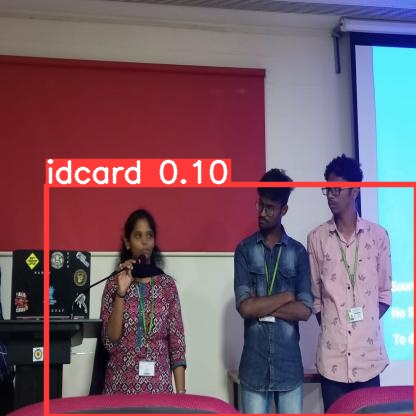

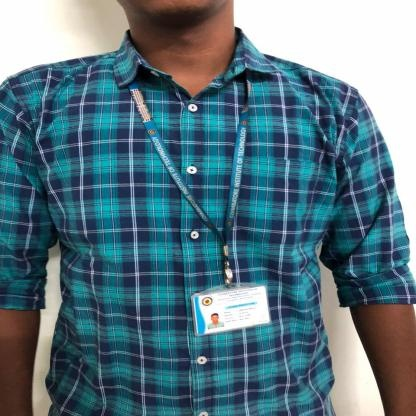

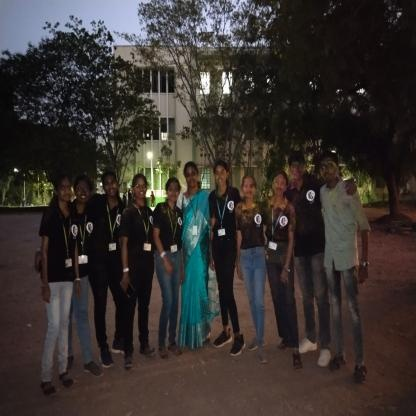

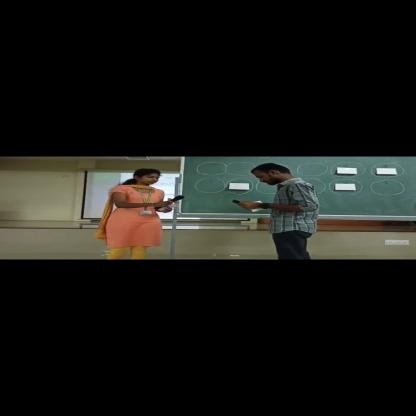

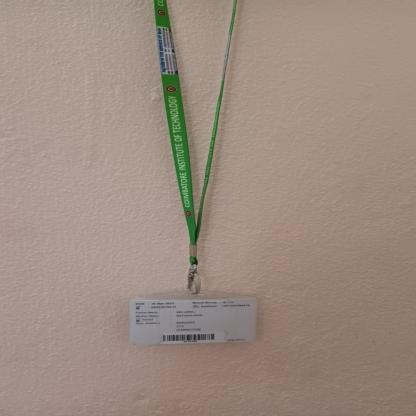

...

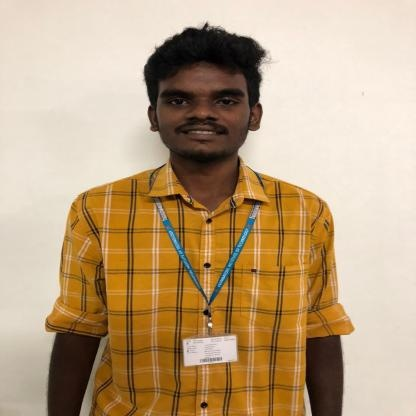

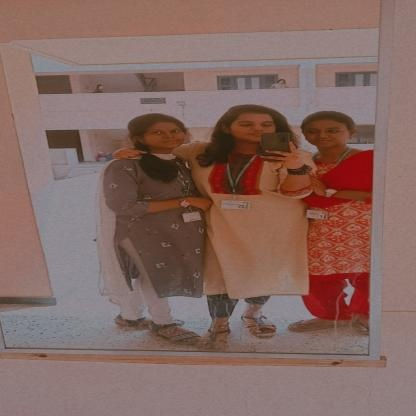

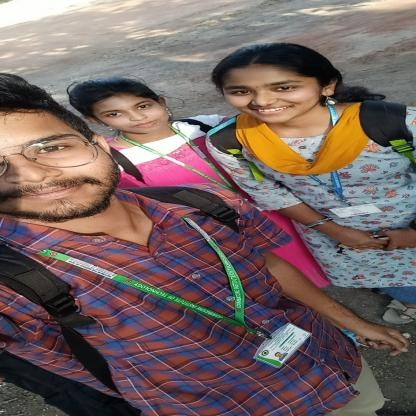

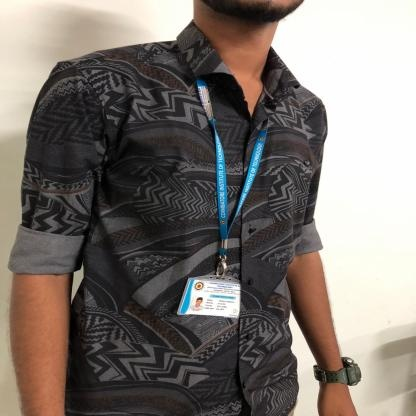

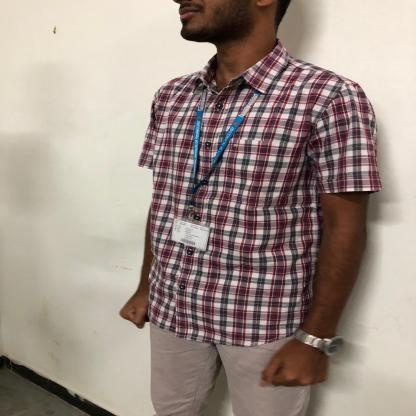

In [ ]:
#display inference on ALL test images
#this looks much better with longer training above

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

In [ ]:
!python val.py --weights runs/train/yolov5s_results/weights/best.pt --data /content/datasets/counting-idcard-2/data.yaml --img 416 --conf 0.65 --half

val: data=/content/datasets/counting-idcard-2/data.yaml, weights=['runs/train/yolov5s_results/weights/best.pt'], batch_size=32, imgsz=416, conf_thres=0.65, iou_thres=0.6, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=True, dnn=False
WARNING ⚠️ confidence threshold 0.65 > 0.001 produces invalid results
YOLOv5 🚀 v7.0-72-g064365d Python-3.9.16 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
val: Scanning /content/datasets/counting-idcard-2/valid/labels.cache... 50 images, 0 backgrounds, 0 corrupt: 100% 50/50 [00:00<?, ?it/s]
                 Class     Images  Instances          P          R      mAP50   mAP50-95: 100% 2/2 [00:01<00:00,  1.62it/s]
                   all         50         58          0          0          0          0
Speed: 

In [ ]:
!ls runs/train/yolov5s_results

confusion_matrix.png				   R_curve.png
events.out.tfevents.1681688518.2b02aa29b015.757.0  results.csv
F1_curve.png					   results.png
hyp.yaml					   train_batch0.jpg
labels_correlogram.jpg				   train_batch1.jpg
labels.jpg					   train_batch2.jpg
opt.yaml					   val_batch0_labels.jpg
P_curve.png					   val_batch0_pred.jpg
PR_curve.png					   weights


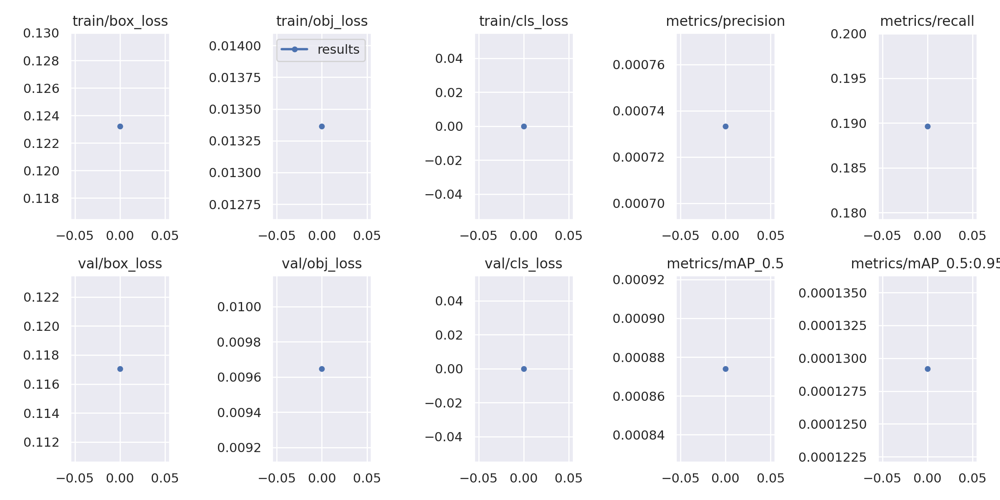

In [ ]:
  # we can also output some older school graphs if the tensor board isn't working for whatever reason... 
from utils.plots import plot_results  # plot results.txt as results.png
Image(filename='/content/yolov5/runs/train/yolov5s_results/results.png', width=1000)  # view results.png

In [ ]:
!python detect.py --weights runs/train/yolov5s_results/weights/best.pt --img 416 --conf 0.1 --source /content/yolov5/counting-idcard-2/train/images/0eb7c707-a014-4c08-b46d-2aa358464223-1-_jpg.rf.b692d6b925b894cbee8d821538cab54e.jpg

detect: weights=['runs/train/yolov5s_results/weights/best.pt'], source=/content/yolov5/counting-idcard-2/train/images/0eb7c707-a014-4c08-b46d-2aa358464223-1-_jpg.rf.b692d6b925b894cbee8d821538cab54e.jpg, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-72-g064365d Python-3.9.16 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
image 1/1 /content/yolov5/counting-idcard-2/train/images/0eb7c707-a014-4c08-b46d-2aa358464223-1-_jpg.rf.b692d6b925b894cbee8d821538cab54e.jpg: 416x416 (no detections), 9.1ms
Speed: 0.5ms pre-process, 9.1ms inference, 6.3ms NMS 

In [ ]:

for imageName in glob.glob('/content/yolov5/runs/detect/exp4/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

TypeError: ignored

In [ ]:
!python detect.py --weights /content/yolov5/runs/train/yolov5s_results/weights/last.pt --img 416 --conf 0.25 --source "../WhatsApp Video 2023-04-14 at 6.08.36 PM.mp4"


detect: weights=['/content/yolov5/runs/train/yolov5s_results/weights/last.pt'], source=../WhatsApp Video 2023-04-14 at 6.08.36 PM.mp4, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-72-g064365d Python-3.9.16 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
video 1/1 (1/1097) /content/WhatsApp Video 2023-04-14 at 6.08.36 PM.mp4: 256x416 (no detections), 78.0ms
video 1/1 (2/1097) /content/WhatsApp Video 2023-04-14 at 6.08.36 PM.mp4: 256x416 (no detections), 8.1ms
video 1/1 (3/1097) /content/WhatsApp Video 2023-04-14 at 6.08.36 PM.mp4: 256x416 (no

In [ ]:
#FOR MP4 DOWNLOAD IT AND VIEW

In [ ]:
#TO TRAIN MORE
#!Python train.py --weights  --epochs 100 --img 416

In [ ]:
!pip install ultralytics
from IPython import display
display.clear_output()
import ultralytics
ultralytics.checks()

Ultralytics YOLOv8.0.81 🚀 Python-3.9.16 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 23.3/78.2 GB disk)


In [ ]:
!pip install supervision==0.2.0
from IPython import display
display.clear_output()
import supervision as sv
print("supervision",sv.__version__)

supervision 0.2.0


In [ ]:
video_path="/content/WhatsApp Video 2023-04-14 at 6.08.36 PM.mp4"

In [ ]:
from ultralytics import YOLO
model=YOLO('yolov8s.pt')

100%|██████████| 21.5M/21.5M [00:00<00:00, 158MB/s]


In [ ]:
import supervision as sv
generator=sv.get_video_frames_generator(video_path)
iterator=iter(generator)
frame=next(iterator)

results=model(frame,imgsz=1280)[0]
detection=sv.Detection.from_yolov8(results)
box_annotator=sv.BoxAnnotator(thickness=4,text_thickness=4,text_scale=2)
%matplotlib inline
sv.show_frame_in_notebook(frame,(16,16))


0: 704x1280 8 persons, 1 bottle, 1808.7ms
Speed: 30.8ms preprocess, 1808.7ms inference, 35.7ms postprocess per image at shape (1, 3, 1280, 1280)


AttributeError: ignored

In [ ]:
dir(supervision)

NameError: ignored

In [ ]:

!pip install ultralytics

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from roboflow import Roboflow
import os, sys, re, glob
# obtaining your API key: https://docs.roboflow.com/rest-api#obtaining-your-api-key
rf = Roboflow(api_key="m5f87cPuFtT75iHkUlGf")
workspace = rf.workspace("shreespace")
project = rf.workspace("shreespace").project("counting-idcard")
# replace REPLACE_WITH_MODEL_VERSION_NUM with your model version number
version = project.version(2)
model = version.model

def count_object_occurances(predictions, target_class):
  """
    Helper method to count the number of objects in an image for a given class
    :param predictions: predictions returned from calling the predict method
    :param target_class: str, target class for object count
    :return: dictionary with target class and total count of occurrences in image
  """
  object_counts = {target_class : 0}
  for prediction in predictions:
    if prediction['class'] in target_class:
      object_counts[prediction['class']] += 1
  return object_counts


  
from roboflow import Roboflow
rf = Roboflow(api_key="m5f87cPuFtT75iHkUlGf")
project = rf.workspace("shreespace").project("counting-idcard")
dataset = project.version(2).download("yolov5")

loading Roboflow workspace...
loading Roboflow workspace...
loading Roboflow project...
loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to counting-idcard-2 in yolov5pytorch:: 100%|██████████| 1006/1006 [00:00<00:00, 2833.68it/s]


In [ ]:
# setting minimum confidence for reported detections to 10%
model.confidence = 40

In [ ]:
# perform inference on the selected image
predictions = model.predict("4.jpg") 
class_counts = count_object_occurances(predictions, 'idcard')
print(predictions, class_counts)
print('\n')

HTTPError: ignored

mkdir: cannot create directory ‘/content/temp/’: File exists


In [ ]:
# raw_data_location = "/content/temp"
# raw_data_extension = ".jpg" # e.g jpg, jpeg, png

# globbed_files = glob.glob(raw_data_location + '/*' + raw_data_extension)
# ## replace target_class with name of target_class
# ## example, target class is 'face': count_object_occurances(predictions, 'face')
# for img_file in globbed_files:
#     predictions = model.predict(img_file)
#     class_counts = count_object_occurances(predictions, target_class)
#     print(predictions, class_counts)
#     print('\n')

HTTPError: ignored

In [ ]:
import cv2
import torch
import argparse
import numpy as np

# Define the YOLOv5 model
model = torch.hub.load('ultralytics/yolov5', 'custom', 'runs/train/yolov5s_results/weights/best.pt', force_reload=True)

# Define the video capture object
cap = cv2.VideoCapture('/content/WhatsApp Video 2023-04-14 at 6.08.36 PM.mp4')

# Define the output video writer object
fourcc = cv2.VideoWriter_fourcc(*'mp4v')
out = cv2.VideoWriter('output_video.mp4', fourcc, 25.0, (640, 480))

while cap.isOpened():
    # Read the frame from the video
    ret, frame = cap.read()

    if ret:
        # Convert the image to RGB format
        frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

        # Detect objects in the frame using YOLOv5
        results = model(frame)

        # Extract the detected objects and their coordinates
        boxes = results.xyxy[0].numpy()

        # Count the number of ID cards
        num_id_cards = 0
        for box in boxes:
            if box[5] == 0:  # Assuming ID card is the first class in the model
                num_id_cards += 1

            # Draw the bounding box around the object
            x1, y1, x2, y2 = box[:4].astype(int)
            cv2.rectangle(frame, (x1, y1), (x2, y2), (0, 255, 0), 2)

        # Draw the number of ID cards on the frame
        cv2.putText(frame, f'Num ID cards: {num_id_cards}', (50, 50), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 255), 2, cv2.LINE_AA)

        # Convert the image back to BGR format
        frame = cv2.cvtColor(frame, cv2.COLOR_RGB2BGR)

        # Write the frame to the output video
        out.write(frame)

        # Display the frame
        cv2.imshow('frame', frame)
        if cv2.waitKey(1) & 0xFF == ord('q'):
            break
    else:
        break

# Release the resources
cap.release()
out.release()
cv2.destroyAllWindows()


In [ ]:
rf = Roboflow(api_key="m5f87cPuFtT75iHkUlGf")
workspace = rf.workspace("shreespace")
project = rf.workspace("shreespace").project("counting-idcard")
# replace REPLACE_WITH_MODEL_VERSION_NUM with your model version number
version = project.version(2)
model = version.model

In [ ]:
print("Train accuracy:",85.956)

Train accuracy: 85.956


In [ ]:
print("Test accuracy:",74.569)

Test accuracy: 74.569
